Calculate the Bayes Factor for $u-r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys_(1).fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
ur_NSA = np.array(catalog_main['u_r'])

# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [6]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [7]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [9]:
del catalog_main, catalog_north, data

# Fit the color distributions with skewnormal distributions

Both one- and two-parent models

This is a bimodal distribution

In [10]:
ur_bins = np.arange(0.5, 4, 0.05)

In [11]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

labels1_tri = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                    'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$', 
                    'c', r'$\mu_c$', r'$\sigma_c$', 'skew$_c$']
labels2_tri = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
               '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
               '$c_2$', r'$\mu_{1c}$', r'$\sigma_{1c}$', 'skew$_{1c}$', 
               '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
               '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$', 
               '$c_2$', r'$\mu_{2c}$', r'$\sigma_{2c}$', 'skew$_{2c}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

#### Void v. wall

In [12]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-noRmin(1).pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

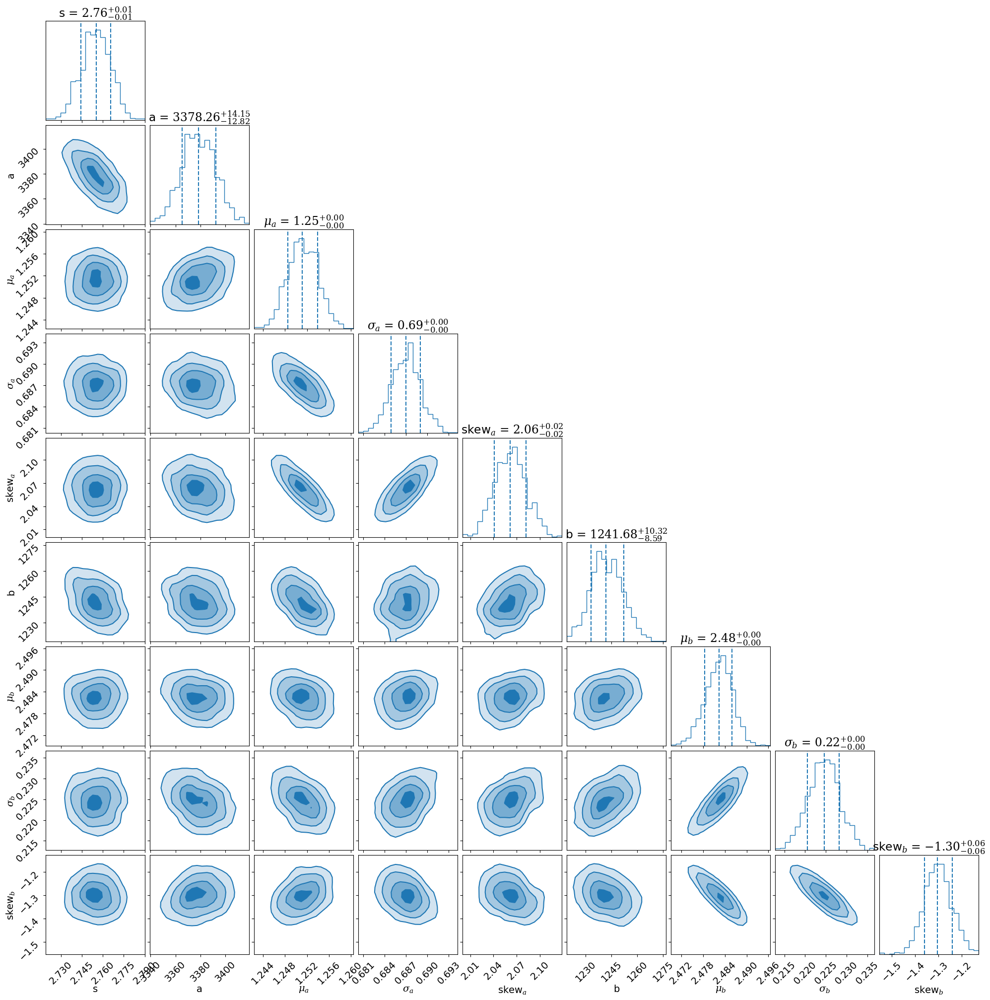

In [13]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [14]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1340.470234363279

In [15]:
V2noRmin_bestfit1 = np.median(V2noRmin_results1['samples'], axis=0)

V2noRmin_bestfit1

array([ 2.7551162e+00,  3.3782593e+03,  1.2511600e+00,  6.8697429e-01,
        2.0617104e+00,  1.2416775e+03,  2.4824460e+00,  2.2462341e-01,
       -1.3031545e+00], dtype=float32)

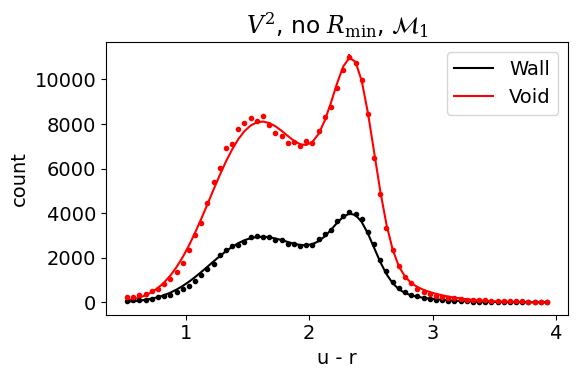

In [16]:
Model_1_plot(V2noRmin_bestfit1, 
             ur_NSA[wall_noRmin], 
             ur_NSA[void_noRmin], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

### 2-parent model

#### Void v. wall

In [17]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-noRmin(1).pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

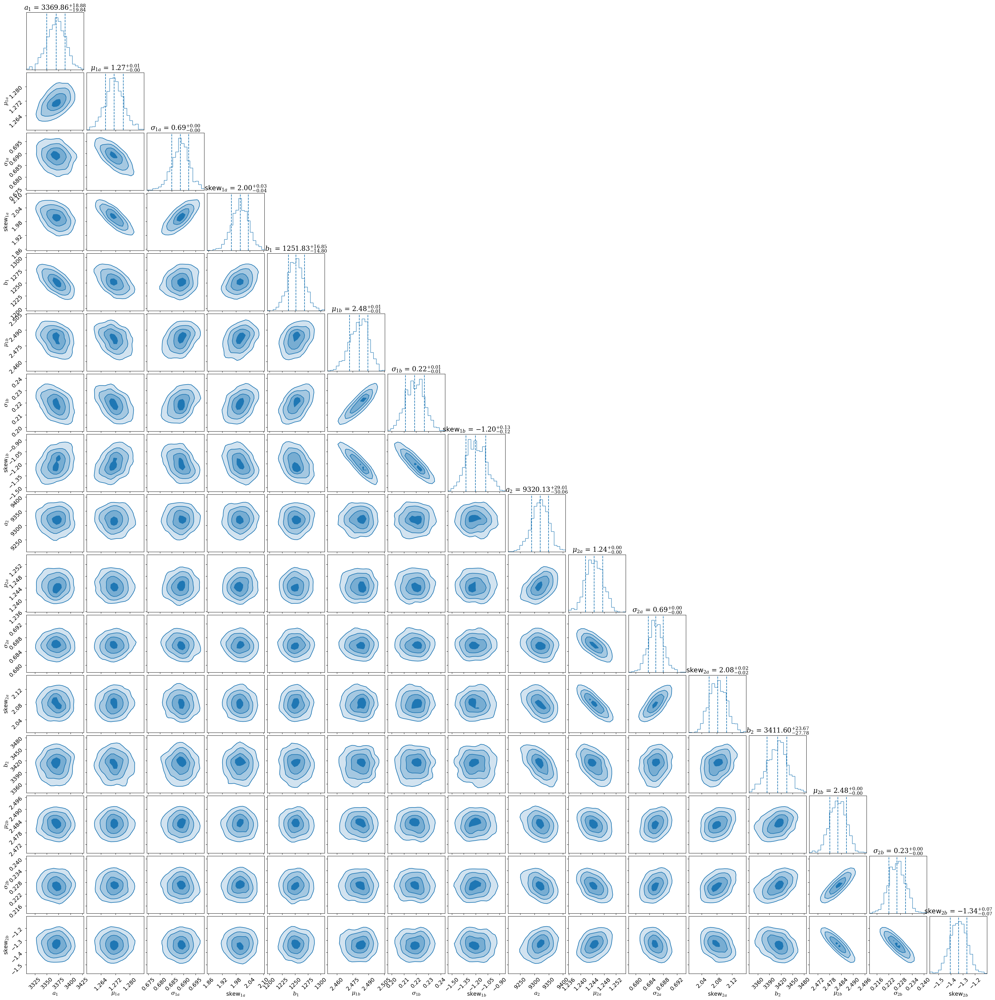

In [18]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [19]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM2_V2noRmin

-1298.6390823642657

In [20]:
V2noRmin_bestfit2 = np.median(V2noRmin_results2['samples'], axis=0)

V2noRmin_bestfit2

array([ 3.3698645e+03,  1.2712541e+00,  6.8864870e-01,  1.9985373e+00,
        1.2518313e+03,  2.4812996e+00,  2.1884933e-01, -1.2044082e+00,
        9.3201318e+03,  1.2446151e+00,  6.8585598e-01,  2.0827074e+00,
        3.4115955e+03,  2.4822938e+00,  2.2619286e-01, -1.3357520e+00],
      dtype=float32)

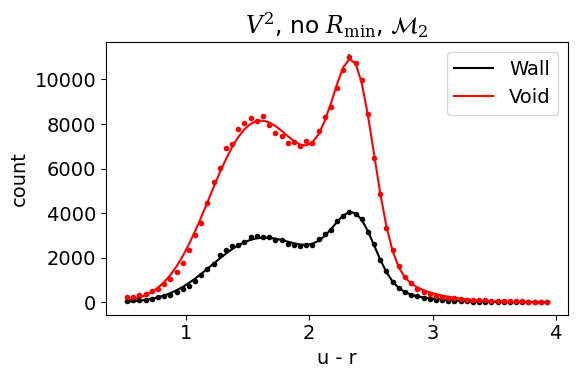

In [21]:
Model_2_plot(V2noRmin_bestfit2, 
             ur_NSA[wall_noRmin], 
             ur_NSA[void_noRmin], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [22]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 (void v. wall) u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 (void v. wall) u-r: B12 = 6.81e-19; log(B12) = -18.167


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

#### Void v. wall

In [32]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-0p1(1).pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

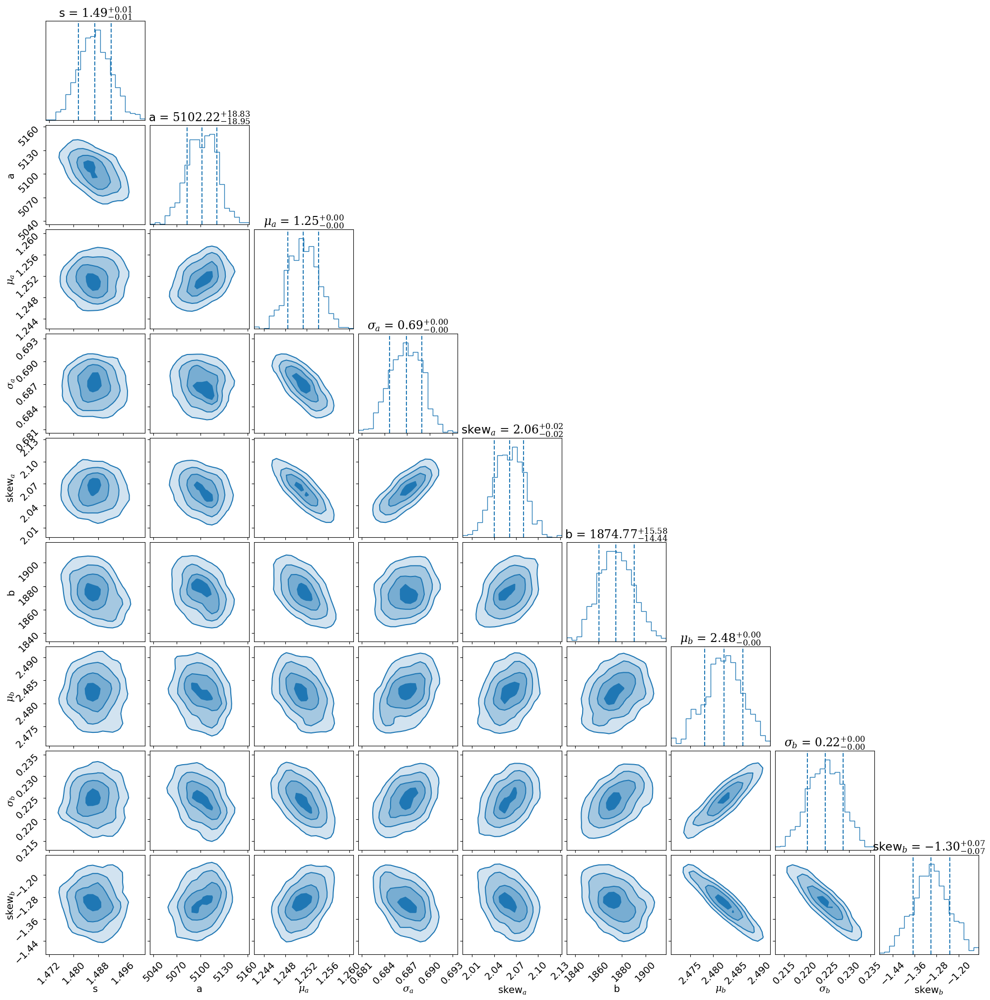

In [33]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [34]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-1362.5100802646468

In [35]:
V2_0p1_bestfit1 = np.median(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.4868407e+00,  5.1022197e+03,  1.2513592e+00,  6.8688059e-01,
        2.0610335e+00,  1.8747664e+03,  2.4823413e+00,  2.2455227e-01,
       -1.3010067e+00], dtype=float32)

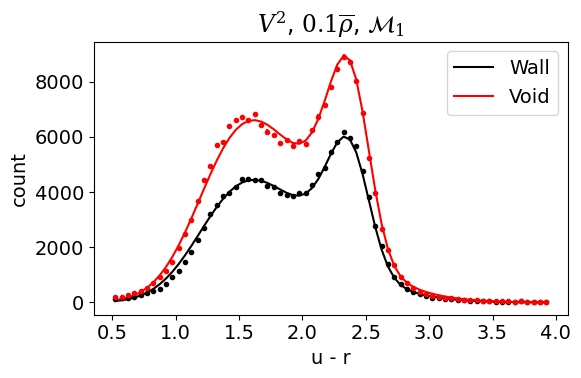

In [36]:
Model_1_plot(V2_0p1_bestfit1, 
             ur_NSA[wall_0p1], 
             ur_NSA[void_0p1], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

In [27]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-0p1(1).pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

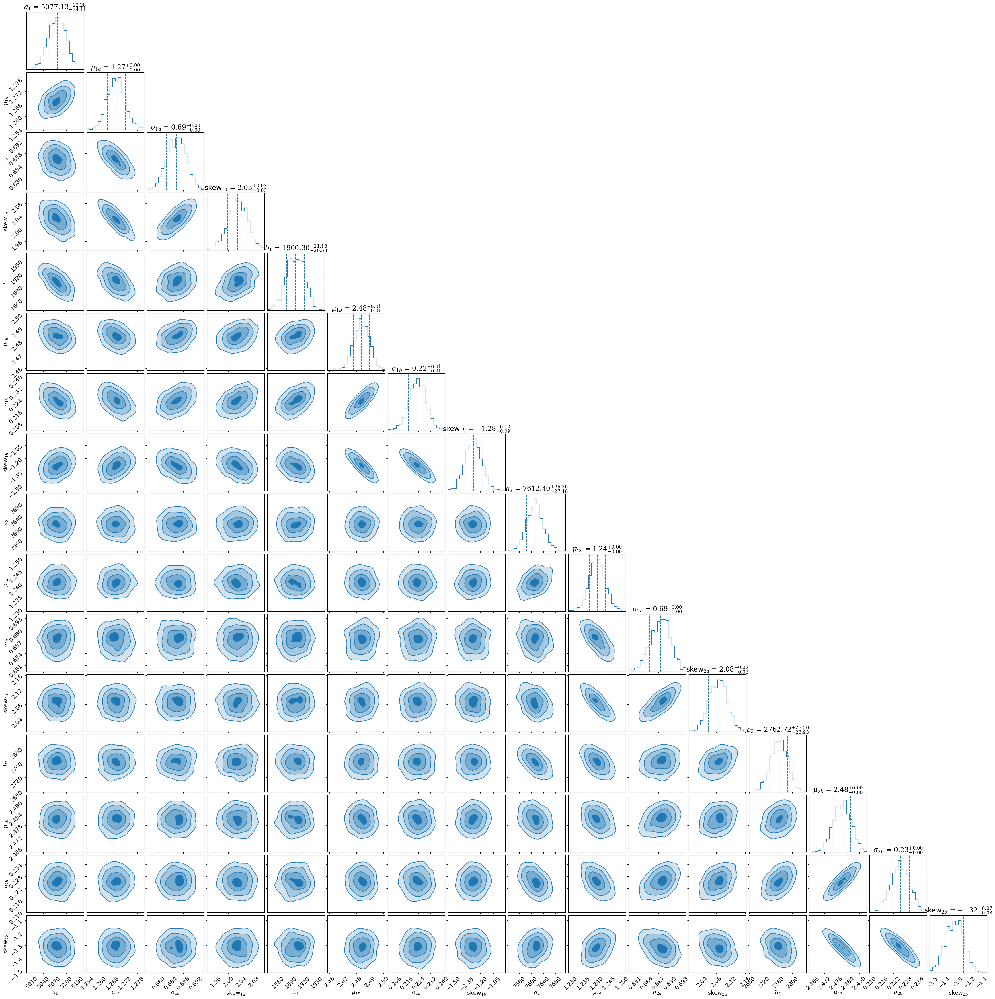

In [28]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [29]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM2_V2_0p1

-1297.1189935242144

In [30]:
V2_0p1_bestfit2 = np.median(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 5.0771260e+03,  1.2679241e+00,  6.8589139e-01,  2.0287645e+00,
        1.9003046e+03,  2.4839165e+00,  2.2308280e-01, -1.2768350e+00,
        7.6124014e+03,  1.2403889e+00,  6.8763649e-01,  2.0846605e+00,
        2.7627227e+03,  2.4811020e+00,  2.2541001e-01, -1.3160448e+00],
      dtype=float32)

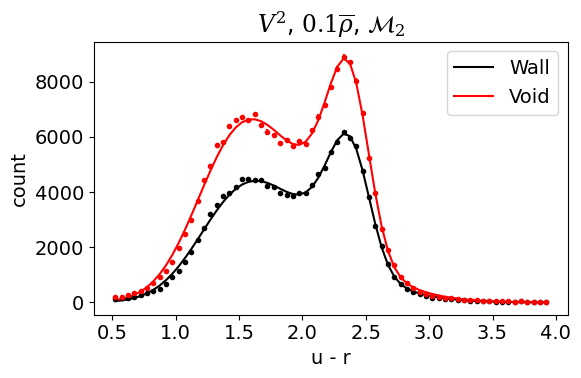

In [31]:
Model_2_plot(V2_0p1_bestfit2, 
             ur_NSA[wall_0p1], 
             ur_NSA[void_0p1], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [37]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 (void v. wall) u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 (void v. wall) u-r: B12 = 3.99e-29; log(B12) = -28.399


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

#### Void v. wall

In [38]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-0p3(1).pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

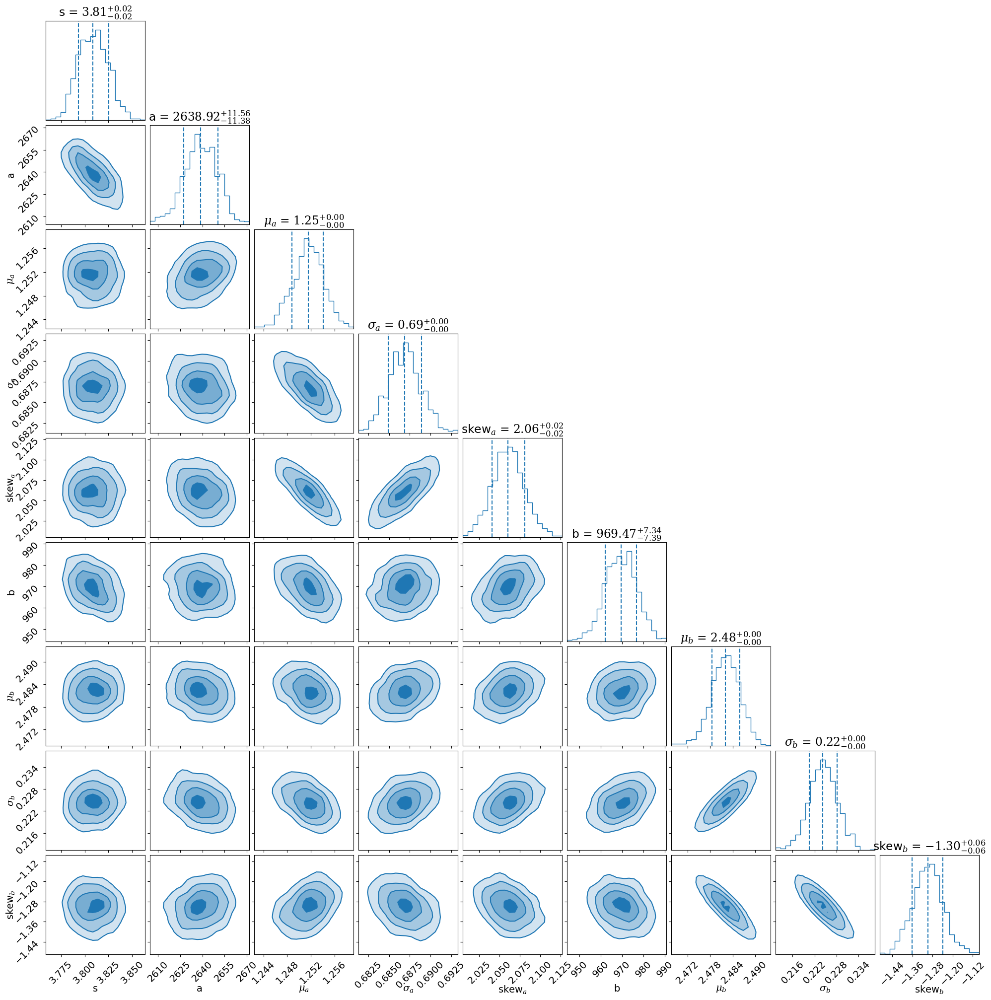

In [39]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [40]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-1407.9583089210357

In [41]:
V2_0p3_bestfit1 = np.median(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.8087401e+00,  2.6389180e+03,  1.2515414e+00,  6.8685412e-01,
        2.0603042e+00,  9.6946582e+02,  2.4821103e+00,  2.2428241e-01,
       -1.2976817e+00], dtype=float32)

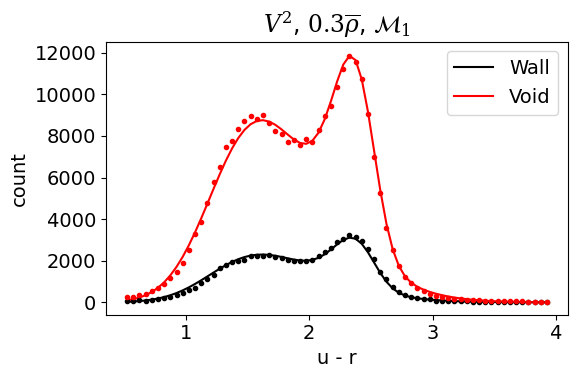

In [42]:
Model_1_plot(V2_0p3_bestfit1, 
             ur_NSA[wall_0p3], 
             ur_NSA[void_0p3], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$');

### 2-parent model

In [43]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-0p3(1).pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

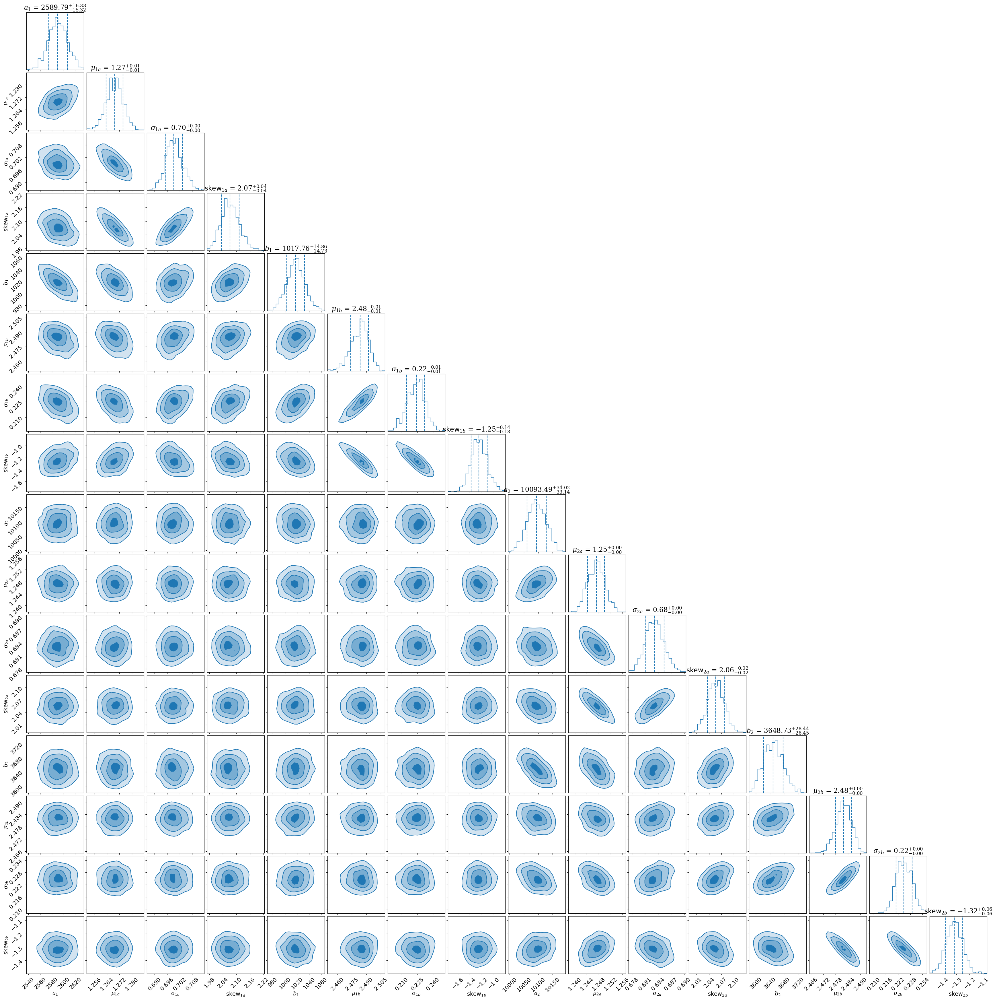

In [44]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [45]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM2_V2_0p3

-1288.8869696905829

In [46]:
V2_0p3_bestfit2 = np.median(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 2.58978857e+03,  1.26891792e+00,  6.99213028e-01,  2.07121301e+00,
        1.01776294e+03,  2.48365116e+00,  2.24034488e-01, -1.24863172e+00,
        1.00934883e+04,  1.24722052e+00,  6.83189631e-01,  2.05597305e+00,
        3.64873145e+03,  2.48193264e+00,  2.24823162e-01, -1.31515336e+00],
      dtype=float32)

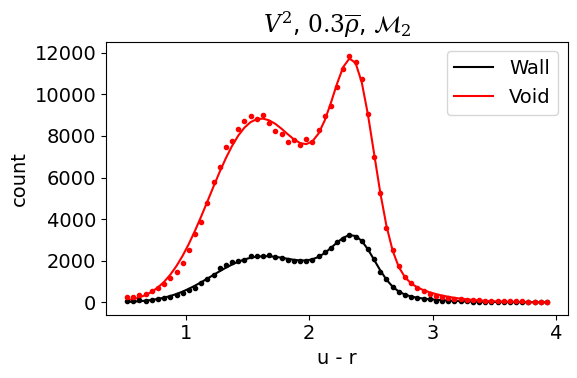

In [47]:
Model_2_plot(V2_0p3_bestfit2, 
             ur_NSA[wall_0p3], 
             ur_NSA[void_0p3], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$');

### Calculate Bayes factor

#### Void v. wall

In [48]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 (void v. wall) u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 (void v. wall) u-r: B12 = 1.94e-52; log(B12) = -51.712
